In [1]:
import numpy as np
import pandas as pd
import os
from os import listdir
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go


# QUESTION 1

I received 31% in quiz. The question that surprised me most is the percentage of people living in extreme poverty and that value was much more than I anticipated and almost all the elements were more actually uplifting that I expected then to be. I was more interested in population change over years and plotter the same asian sub continents population showed a decreasing change which was positive news.


In [2]:
data_set_location = "/home/quazar07/Desktop/InfoViz/ddf--gapminder--systema_globalis-master/"
population_dataset_name = "ddf--datapoints--population_total--by--geo--time.csv"
world_4_regions_name = "ddf--entities--geo--world_4region.csv"
contries_to_world_regions_name = "ddf--entities--geo--country.csv"
gdp_data_name = "ddf--datapoints--income_per_person_gdppercapita_ppp_inflation_adjusted--by--geo--time.csv"
life_expectancy_name = "ddf--datapoints--life_expectancy_years--by--geo--time.csv"
child_mortality_name = "ddf--datapoints--child_mortality_0_5_year_olds_dying_per_1000_born--by--geo--time.csv"
richest_20_name = "ddf--datapoints--income_share_of_richest_20percent--by--geo--time.csv"
poorest_20_name = "ddf--datapoints--income_share_of_poorest_20percent--by--geo--time.csv"
cellphone_name = "ddf--datapoints--cell_phones_per_100_people--by--geo--time.csv"

population_data = pd.read_csv(data_set_location+population_dataset_name)
world_regions = pd.read_csv(data_set_location+world_4_regions_name)
countries_to_world_regions = pd.read_csv(data_set_location+contries_to_world_regions_name)
gdp_data = pd.read_csv(data_set_location+gdp_data_name)
life_expectancy_data = pd.read_csv(data_set_location+life_expectancy_name)
child_mortality_data = pd.read_csv(data_set_location+child_mortality_name)
richest_20_data = pd.read_csv(data_set_location+richest_20_name)
poorest_20_data = pd.read_csv(data_set_location+poorest_20_name)
cellphone_data = pd.read_csv(data_set_location+cellphone_name)

In [3]:
# print(countries_to_world_regions)
map_countries_to_regions = dict(zip(countries_to_world_regions['country'],countries_to_world_regions['world_4region']))
map_countries_iso_alpha = dict(zip(countries_to_world_regions['country'],countries_to_world_regions['iso3166_1_alpha3']))
map_countries_continents = dict(zip(countries_to_world_regions['iso3166_1_alpha3'],countries_to_world_regions['world_6region']))

In [4]:
countries_to_world_regions.head()

,country,alt_5,alternative_1,alternative_2,alternative_3,alternative_4_cdiac,arb1,arb2,arb3,arb4,...,latitude,longitude,main_religion_2008,name,pandg,un_state,unicode_region_subtag,upper_case_name,world_4region,world_6region
0,abkh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Abkhazia,NaN,False,NaN,NaN,europe,europe_central_asia
1,abw,NaN,NaN,NaN,NaN,Aruba,NaN,NaN,NaN,NaN,...,12.50000,-69.96667,christian,Aruba,NaN,False,AW,ARUBA,americas,america
2,afg,NaN,Islamic Republic of Afghanistan,NaN,NaN,Afghanistan,NaN,NaN,NaN,NaN,...,33.00000,66.00000,muslim,Afghanistan,AFGHANISTAN,True,AF,AFGHANISTAN,asia,south_asia
3,ago,NaN,NaN,NaN,NaN,Angola,NaN,NaN,NaN,NaN,...,-12.50000,18.50000,christian,Angola,ANGOLA,True,AO,ANGOLA,africa,sub_saharan_africa
4,aia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,18.21667,-63.05000,christian,Anguilla,NaN,False,AI,ANGUILLA,americas,america


In [5]:
population_data['geo'] = population_data['geo'].map(map_countries_to_regions)

In [6]:
grouped_data = population_data.groupby(['time','geo'])['population_total'].sum().unstack()

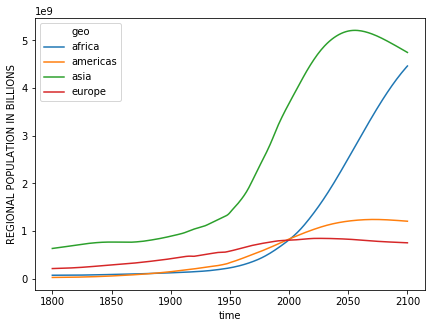

In [7]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(7,5))
ax.set_xlabel('YEAR')
ax.set_ylabel('REGIONAL POPULATION IN BILLIONS')
grouped_data.plot(ax=ax)

# QUESTION 2

In [8]:
gdp_data_iso = gdp_data
gdp_data_iso['geo']  = gdp_data['geo'].map(map_countries_iso_alpha)

In [9]:
fig = px.choropleth(gdp_data_iso, locations="geo",
                    color="income_per_person_gdppercapita_ppp_inflation_adjusted", 
                    hover_name="geo", 
                    animation_frame='time', color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

The percapita income increases continuously and the same is expecred and the contries with lower percapita income get oversighted by countries with higher values and are hard to notice.

# QUESTION 3 

In [10]:
child_mortality_data['geo'] = child_mortality_data['geo'].map(map_countries_iso_alpha)
life_expectancy_data['geo'] = life_expectancy_data['geo'].map(map_countries_iso_alpha)

In [11]:
merge_gdp_childM = pd.merge(gdp_data_iso, child_mortality_data,  how='inner', on=['geo','time'])
merge_gdp_childM_lifeE = pd.merge(merge_gdp_childM, life_expectancy_data,  how='inner', on=['geo','time'])


In [12]:
merge_gdp_childM_lifeE['continent'] = merge_gdp_childM_lifeE['geo'].map(map_countries_continents)

In [13]:
merge_gdp_childM_lifeE.head()

,geo,time,income_per_person_gdppercapita_ppp_inflation_adjusted,child_mortality_0_5_year_olds_dying_per_1000_born,life_expectancy_years,continent
0,AFG,1800,603,468.58,28.21,south_asia
1,AFG,1801,603,468.58,28.20,south_asia
2,AFG,1802,603,468.58,28.19,south_asia
3,AFG,1803,603,468.58,28.18,south_asia
4,AFG,1804,603,468.58,28.17,south_asia


In [14]:
fig = px.scatter(merge_gdp_childM_lifeE,x='income_per_person_gdppercapita_ppp_inflation_adjusted',y='life_expectancy_years',
                 facet_col='continent',size='child_mortality_0_5_year_olds_dying_per_1000_born',animation_frame='time',color='continent',range_y=[0,100])

fig.update_xaxes(title_text='GDP/capita')
fig.update_yaxes(title_text='life expectancy')
fig.update_layout(title_text='')
fig.show()

The child mortality and Life expectancy increase for all the countries as GDP percapita increases. African continent  has lesses GDP on average than other continents. 
It can be clealy seen that some values are hard to observe as some values decrease rather abruptly.

# Question 4

In [15]:
richest_20_data['geo'] = richest_20_data['geo'].map(map_countries_iso_alpha)
poorest_20_data['geo'] = poorest_20_data['geo'].map(map_countries_iso_alpha)

In [16]:
merge_richest_poorest = pd.merge(richest_20_data, poorest_20_data,  how='inner', on=['geo','time'])
merge_richest_poorest['continent'] = merge_richest_poorest['geo'].map(map_countries_continents)

In [17]:
fig = px.scatter(merge_richest_poorest,x='income_share_of_richest_20percent',y='income_share_of_poorest_20percent',
                 facet_col='continent',animation_frame='time',color='continent',range_x=[0,100],range_y=[0,50])

fig.update_xaxes(title_text='Richest share')
fig.update_yaxes(title_text='Poorest share')
fig.update_layout(title_text='')
fig.show()

Wanted to find if the share of the richest or poorest people would follow any particular trends, but the data was missing many rows and the conclusion remained incomplete, except that in all the continents the share of richest kept increasing and poorest more or less remained the same or decreased, also these factors do not directly affect each other, which is no surprise.

# Question 5

I used interactive plots becaus time series becomes easier to handle. but on the other hand some of the plots get very clumsy and hence gets very hard to read. 